## Pillowの基本的な使い方


### 画像の読み込み

In [12]:
from PIL import Image
import matplotlib.pyplot as plt

In [13]:
from PIL import Image
import matplotlib.pyplot as plt

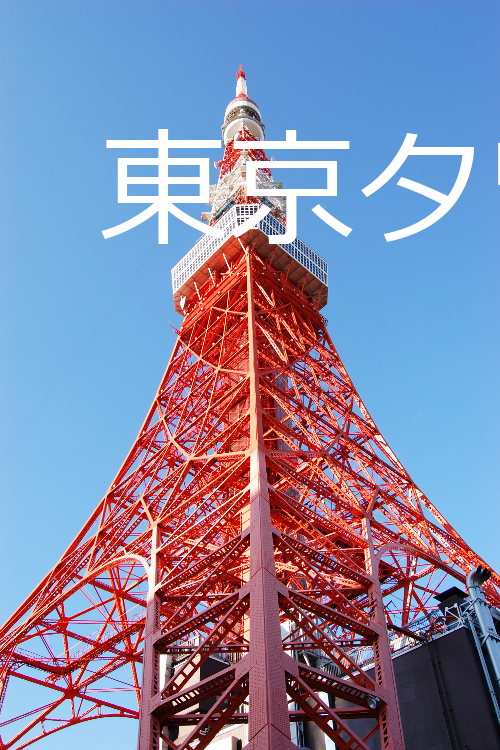

In [14]:
tokyo_tower = Image.open("tokyo_tower.png")
tokyo_tower

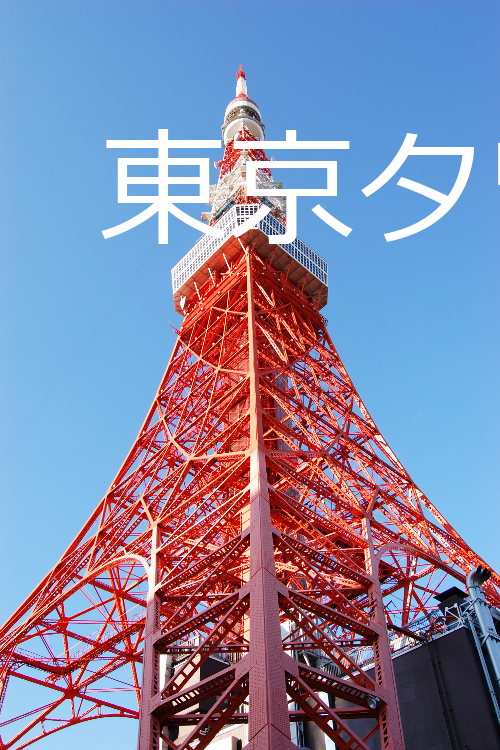

In [15]:
tokyo_tower = Image.open("tokyo_tower.png")
tokyo_tower

In [16]:
# データ型を確認
type(tokyo_tower)

PIL.PngImagePlugin.PngImageFile

### 画像をグレースケールのモノクロ画像へ変換

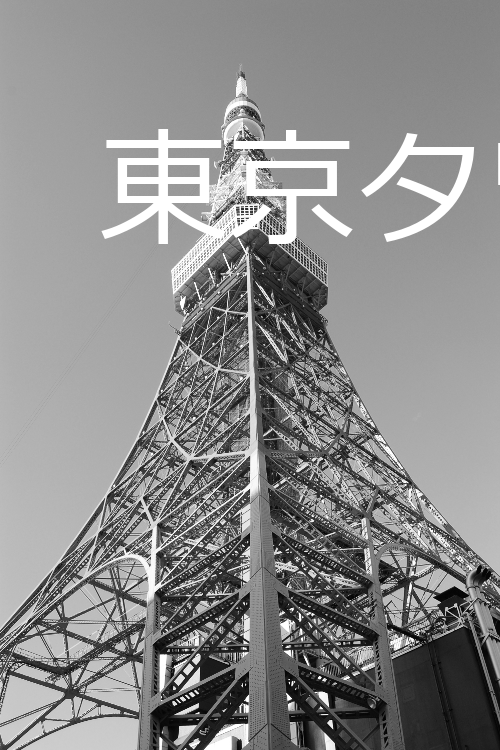

In [17]:
gray_tower = tokyo_tower.convert("L")
gray_tower

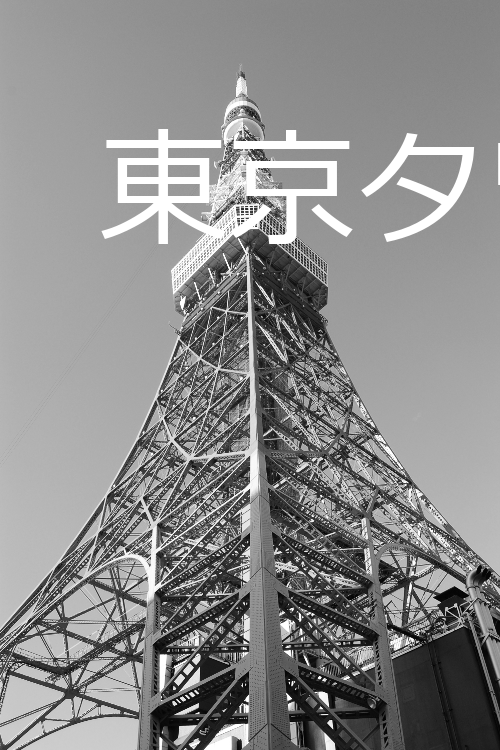

In [18]:
gray_tower = tokyo_tower.convert("L")
gray_tower

### 画像の保存

In [19]:
gray_tower.save("tokyo_tower_gray.png")

In [20]:
gray_tower.save("tokyo_tower_gray.png")

これでモノクロの東京タワーの写真（*tokyo_tower_gray.png*）が *tokyo_tower.png* と同じディレクトリに保管されました。左メニューから開いて確認してみてください。



### 画像のリサイズと回転・平行移動

#### 画像のリサイズ

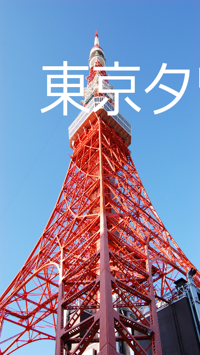

In [21]:
tokyo_tower_resized = tokyo_tower.resize((200, 355))
tokyo_tower_resized

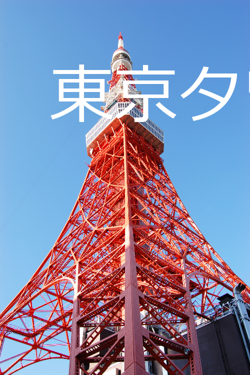

In [22]:
tokyo_tower_resized = tokyo_tower.resize((250, 375))
tokyo_tower_resized

#### 画像の回転

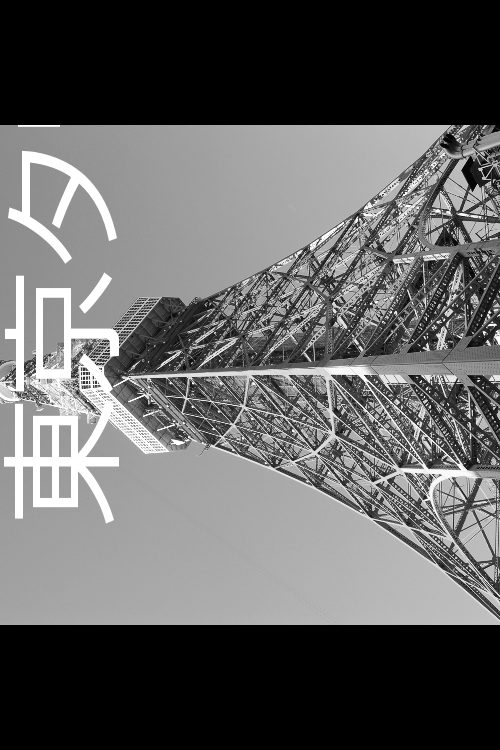

In [23]:
tokyo_tower_rotated = gray_tower.rotate(90)
tokyo_tower_rotated

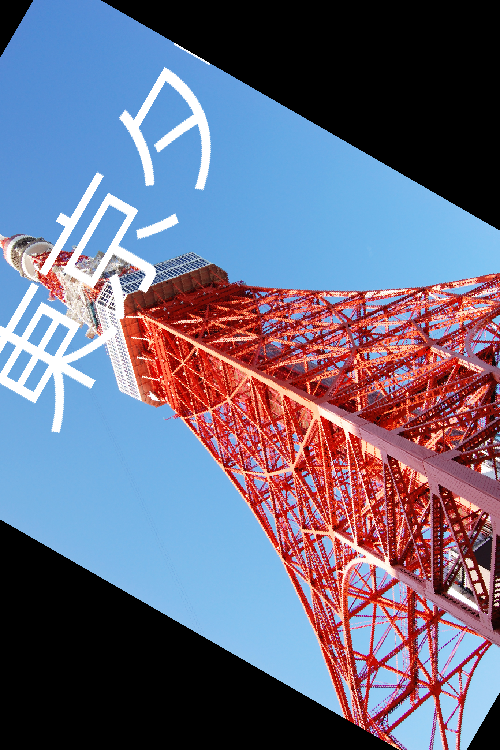

In [24]:
tokyo_tower_rotated = tokyo_tower.rotate(60)
tokyo_tower_rotated

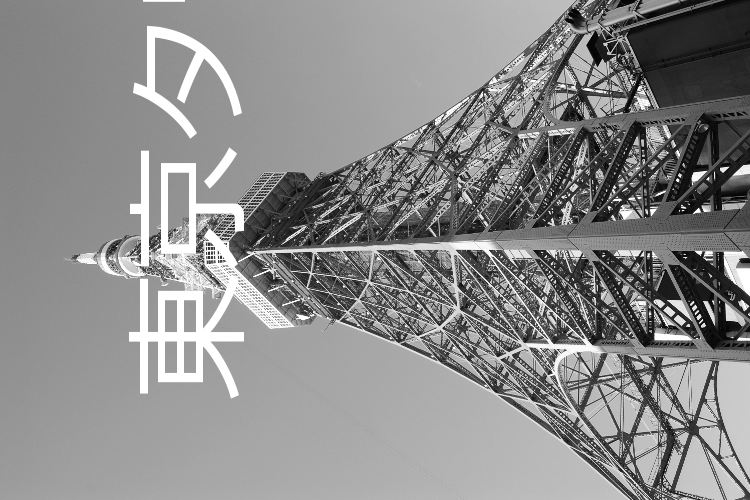

In [25]:
tokyo_tower_rotated = gray_tower.rotate(90, expand=True)
tokyo_tower_rotated

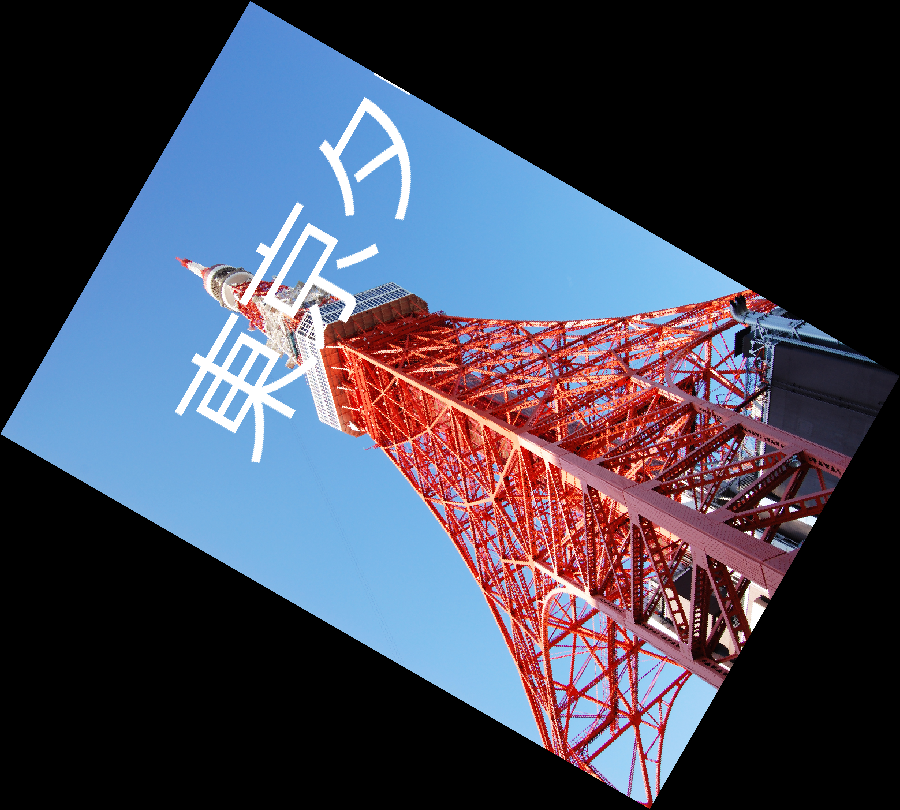

In [26]:
tokyo_tower_rotated = tokyo_tower.rotate(60, expand=True)
tokyo_tower_rotated

#### 画像の平行移動

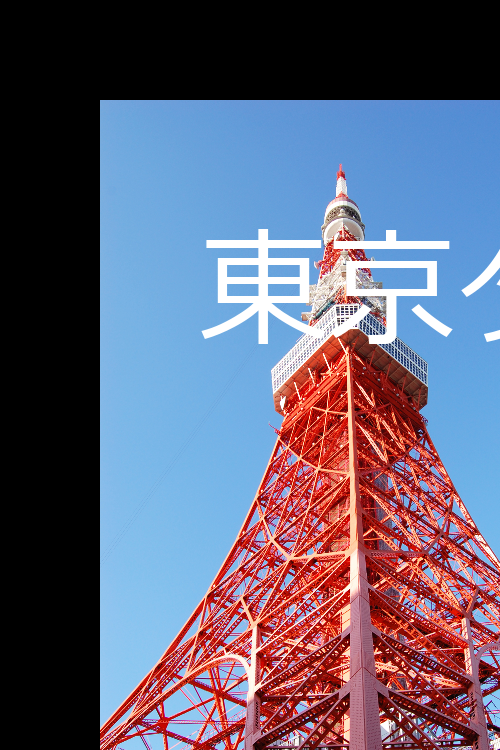

In [27]:
tokyo_tower_translated = tokyo_tower.rotate(0, translate=(100, 100))
tokyo_tower_translated

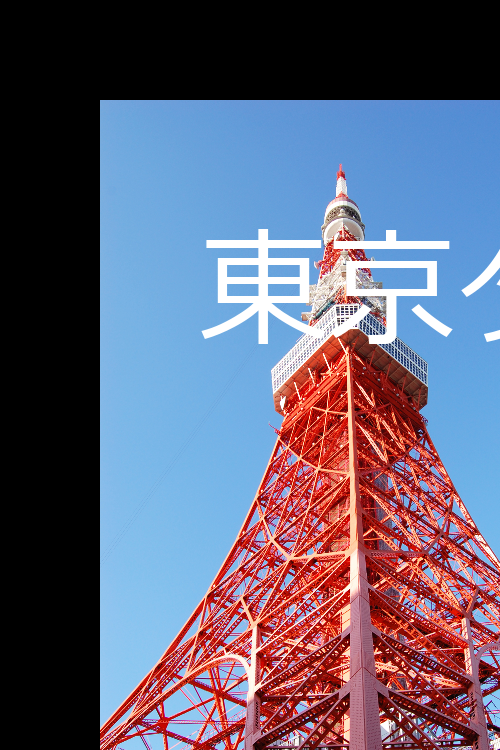

In [28]:
tokyo_tower_translated = tokyo_tower.rotate(0, translate=(100, 100))
tokyo_tower_translated

## 画像をNumPyの配列に変換する

### 画像をndarrayに変換する方法

In [29]:
import numpy as np

In [30]:
tokyo_tower = Image.open("tokyo_tower.png")

In [31]:
color_image = np.array(tokyo_tower)

In [32]:
type(color_image)

numpy.ndarray

### ndarrayに変換した画像データの形式

In [33]:
color_image.shape

(750, 500, 3)

In [34]:
# 左上の端のピクセルの情報
color_image[0, 0, :]

array([116, 166, 218], dtype=uint8)

出力結果の情報は `R（赤）, G（緑）, B（青）` の順でならんでいます。つまり、これは左上のピクセルが、赤 `116`・緑 `166`・青 `218` の色の強さで構成されているということを示しています。

<div class="alert alert-info">
これは光の性質に沿っているので、赤緑青がすべて0なら黒、すべて255なら白い色になります。
</div>

また、たとえば、すべてのピクセルにおいてR（赤）の情報のみを取得したい場合は、以下のようにスライスします。3番目は`R = 0, G = 1, B = 2`で並んでいるので、0と指定すれば赤のみの情報を取得できます。

In [35]:
# 赤のみの情報
color_image[:, :, 0]

array([[116, 119, 120, ...,  86,  88,  89],
       [119, 117, 118, ...,  89,  85,  87],
       [121, 116, 118, ...,  87,  87,  90],
       ...,
       [193, 190, 164, ...,  29,  24,  17],
       [156, 171, 147, ...,  29,  25,  16],
       [157, 146, 149, ...,  29,  28,  19]], dtype=uint8)

#### グレースケールの場合のデータ形式

In [36]:
gray_tower = tokyo_tower.convert("L")
gray_image = np.array(gray_tower)

In [37]:
gray_image.shape

(750, 500)

In [38]:
# 左上の端のピクセルの情報
gray_image[0, 0]

157

### 数値で画像データを持つとできること

#### 明るさの分布を表示

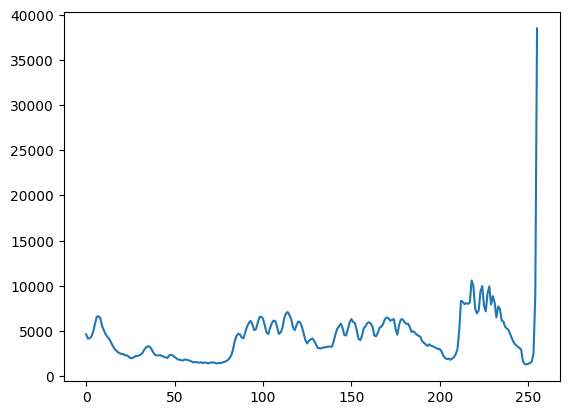

In [39]:
hist_c, bins_c = np.histogram(color_image.flatten(), bins=256)
plt.plot(hist_c)
plt.show()

<div class="alert alert-info">

<code>np.histogram()</code>の戻り値の2つ目には、ヒストグラムの横軸の値がリスト形式で格納されています。今回は<code>bin=256</code>のキーワード引数の指定で256段階にデータを分けていますので、0から255までの数値が<code>bins_c</code>に入っています。
</div>



#### RGB各色の分布を表示

もちろんスライスを使うことで、RGB各色のヒストグラムを表示できます。


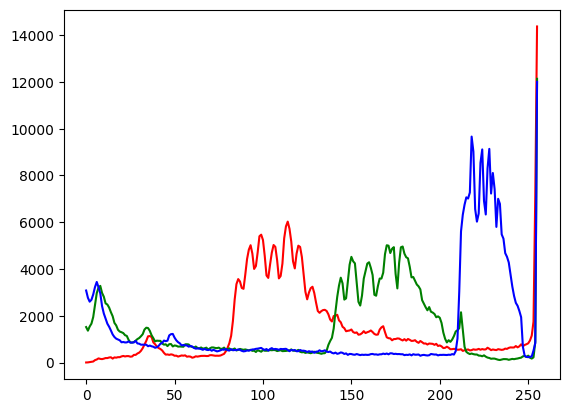

In [40]:
for i, color in enumerate(["red", "green", "blue"]):
    hist_x, bins_x = np.histogram(color_image[:, :, i], bins=256)
    plt.plot(hist_x, color=color)
plt.show()

### ndarray形式の画像の表示

#### その1：Imageに変換する

##### 加工してから表示する例

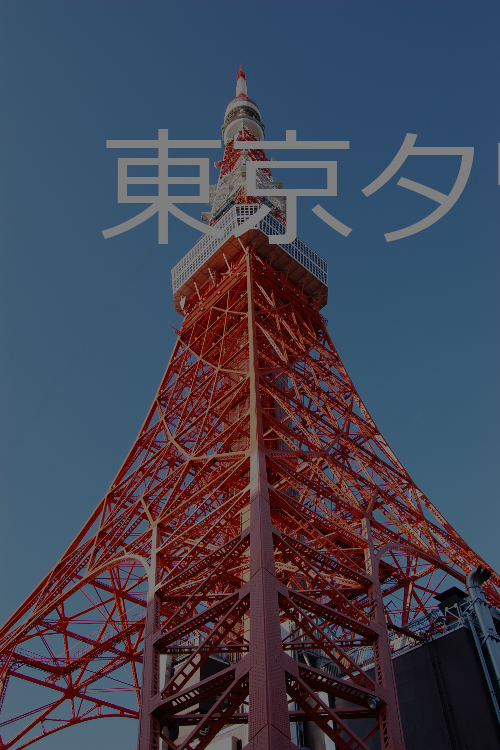

In [41]:
half_image = color_image // 2
half_image = Image.fromarray(np.uint8(half_image))
half_image

### その2：plt.imshow()に直接ndarrayを指定する

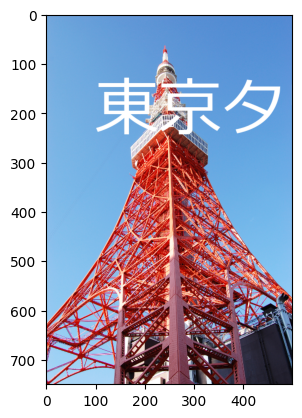

In [42]:
plt.imshow(color_image)
plt.show()

## （参考）応用的な画像加工

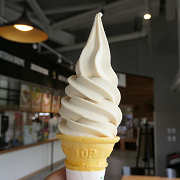

In [43]:
# ライブラリのインポートなど
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# 画像の読み込み
soft_org = Image.open("soft.png")

# 画像の表示
soft_org

In [44]:
soft_org_array = np.array(soft_org)

### 画像の幅と高さを取得

In [45]:
soft_org.width

180

*画像の高さ*

In [46]:
soft_org.height

180

In [47]:
soft_org.size

(180, 180)

### 画像の連結

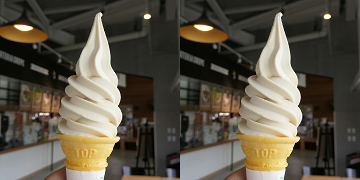

In [48]:
# 土台の作成
#（new()の最初の引数は色空間の指定、2つ目の引数は(幅, 高さ)のタプル）
soft2 = Image.new("RGB", (soft_org.width * 2, soft_org.height))

# 画像の貼り付け
#（paste()の最初の引数は貼り付ける画像、2つ目の引数は左上の座標(横, 縦)のタプル）
soft2.paste(soft_org, (0, 0))
soft2.paste(soft_org, (soft_org.width, 0))

# 新しい画像の表示
soft2

### 画像の切り抜きと分割

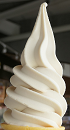

In [49]:
# クリームの部分の切り抜き
soft_crop = soft_org.crop((55, 10, 125, 140))

# 切り抜いた画像の表示
soft_crop

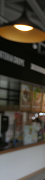

In [50]:
# 画像を横4枚に分割
soft_crop_list = []
for i in range(4):
    soft_crop_list.append(soft_org.crop((45 * i, 0, 45 * (i + 1), soft_org.height)))

# 左端の画像のみ表示
soft_crop_list[0]

### 複数の画像をGIFアニメーションで保存

In [51]:
# 分割した画像をGIFアニメーションとして保存
soft_crop_list[0].save("soft_anim.gif",
                       save_all=True,
                       append_images=soft_crop_list[1:4],
                       loop=0,
                       duration=500)

### RGBの値を操作して画像加工

#### 画像の単色化（減色）

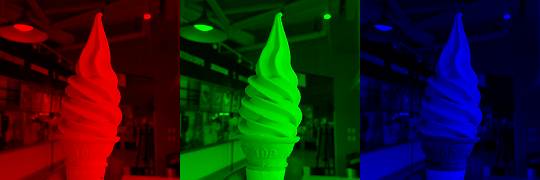

In [52]:
# 赤のみの単色化
soft_r = np.zeros((soft_org.height, soft_org.width, 3), dtype=np.uint8)
soft_r[:, :, 0] = soft_org_array[:, :, 0]

# 緑のみの単色化
soft_g = np.zeros((soft_org.height, soft_org.width, 3), dtype=np.uint8)
soft_g[:, :, 1] = soft_org_array[:, :, 1]

# 青のみの単色化
soft_b = np.zeros((soft_org.height, soft_org.width, 3), dtype=np.uint8)
soft_b[:, :, 2] = soft_org_array[:, :, 2]

# 単色化した画像を横に並べて表示
soft_monos = Image.new("RGB", (soft_org.width * 3, soft_org.height))
soft_monos.paste(Image.fromarray(soft_r), (0, 0))
soft_monos.paste(Image.fromarray(soft_g), (soft_org.width, 0))
soft_monos.paste(Image.fromarray(soft_b), (soft_org.width * 2, 0))
soft_monos

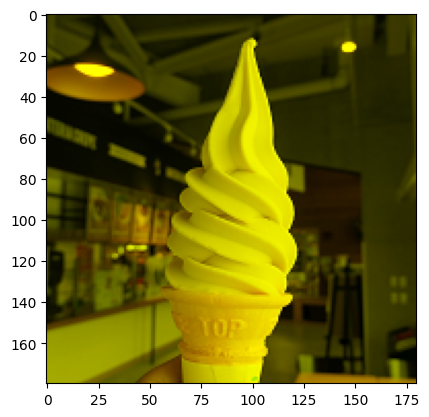

In [53]:
# 青だけ抜いた（赤と緑のみの）画像に加工
soft_rg = np.zeros((soft_org.height, soft_org.width, 3), dtype=np.uint8)
soft_rg[:, :, 0] = soft_org_array[:, :, 0]
soft_rg[:, :, 1] = soft_org_array[:, :, 1]
plt.imshow(soft_rg)
plt.show()

#### 二値化処理

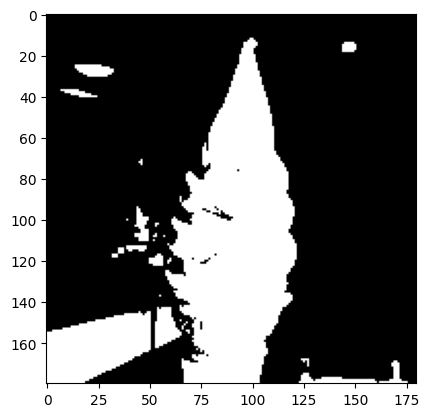

In [54]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

soft_org = Image.open("soft.png")

soft_gr_array = np.array(soft_org.convert("L"))   # グレースケール
soft_wb1 = soft_gr_array // 128                   # 128で割って黒と白どっち寄りか確認
plt.imshow(soft_wb1, cmap="gray")                 # imshowの引数がcmap　黒なのか白なのか
plt.show()

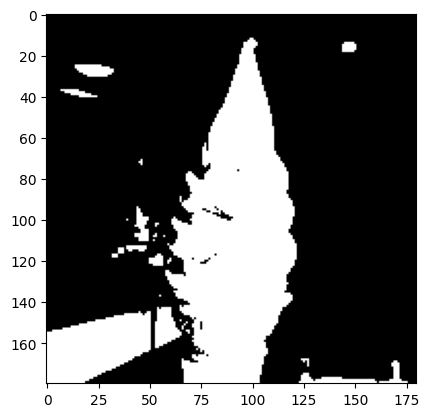

In [55]:
# 色の強さ 128 を基準とした二値化
soft_gr_array = np.array(soft_org.convert("L"))
soft_wb1 = soft_gr_array // 128
plt.imshow(soft_wb1, cmap="gray")
plt.show()

各ピクセルの値を128でわり算（小数点以下は切り捨て）を行い、その商を配列の各要素に代入しなおしています。グレースケール画像として表示する場合、「0と1しか含まれていないデータ」を白と黒のみ（灰色なし）の画像として表示できます。

もちろん、128以外の数値で二値化処理が可能です。

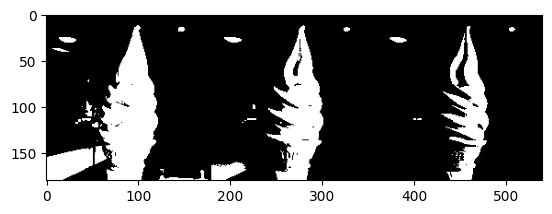

In [56]:
soft_wb2 = soft_gr_array // 160
soft_wb3 = soft_gr_array // 192

# 新しい空の画像（キャンバス）**を作る グレースケール用の3枚並び
soft_wbs =Image.new("L", (soft_org.width * 3, soft_org.height))
soft_wbs.paste(Image.fromarray(soft_wb1), (0, 0))
soft_wbs.paste(Image.fromarray(soft_wb2), (soft_org.width, 0))
soft_wbs.paste(Image.fromarray(soft_wb3), (soft_org.width *2, 0))
plt.imshow(soft_wbs, cmap="gray")
plt.show()

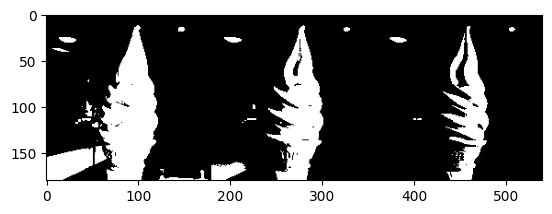

In [57]:
# 色の強さ 160 を基準とした二値化
soft_wb2 = soft_gr_array // 160

# 色の強さ 192 を基準とした二値化
soft_wb3 = soft_gr_array // 192

# 二値化した画像を横に並べて表示
soft_wbs = Image.new("L", (soft_org.width * 3, soft_org.height))
soft_wbs.paste(Image.fromarray(soft_wb1), (0, 0))
soft_wbs.paste(Image.fromarray(soft_wb2), (soft_org.width, 0))
soft_wbs.paste(Image.fromarray(soft_wb3), (soft_org.width * 2, 0))
plt.imshow(soft_wbs, cmap="gray")
plt.show()

#### 特定の条件を満たすピクセルを抽出

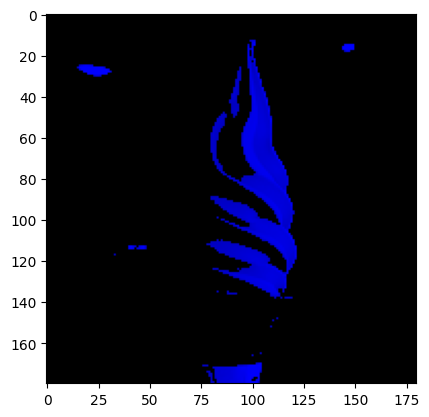

In [69]:
soft_b_trimmed = np.copy(soft_b)
soft_b_wd = soft_b_trimmed[:, :, 2] // 192
soft_b_trimmed[:, :, 2] *= soft_b_wd
plt.imshow(soft_b_trimmed)
plt.show()

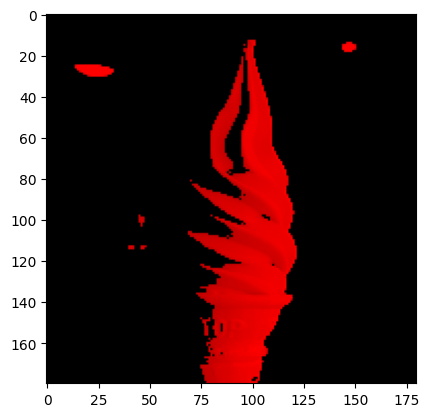

In [59]:
# 赤のみの画像データの元（soft_r）を変更しないよう、複製物の作成
soft_r_trimmed = np.copy(soft_r)

# 赤の色について、色の強さ 192 を基準とした二値化
soft_r_wb = soft_r_trimmed[:, :, 0] // 192

# 赤のみの画像データと二値化したデータのかけ算
soft_r_trimmed[:, :, 0] *= soft_r_wb

# 赤の強さ 192 以上のみのピクセルを残した画像データの表示
plt.imshow(soft_r_trimmed)
plt.show()

#### 特定の条件を満たすピクセルをマスキング

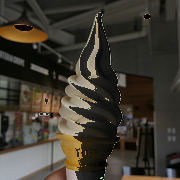

In [71]:
soft_base = Image.new("RGB", (soft_org.width, soft_org.height))
soft_r_trimmed_img = Image.fromarray(soft_r_trimmed[:, :, 0]).convert("L")
soft_maskes = Image.composite(soft_base, soft_org, soft_r_trimmed_img)
soft_masked                                     

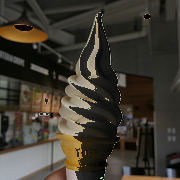

In [60]:
# 土台
soft_base = Image.new("RGB", (soft_org.width, soft_org.height))

# マスキング用のデータ
soft_r_trimmed_img = Image.fromarray(soft_r_trimmed[:, :, 0]).convert("L")

# マスク処理を実行して結果を表示
soft_masked = Image.composite(soft_base, soft_org, soft_r_trimmed_img)
soft_masked

### 画像の重ね合わせ

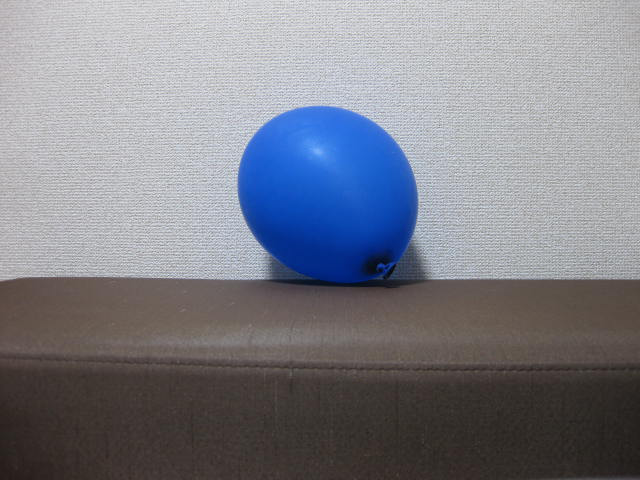

In [74]:
im1 = Image.open("home2.png")
im1

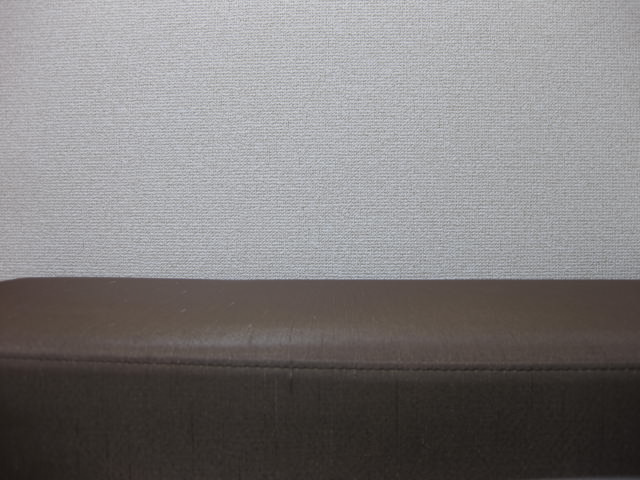

In [75]:
im1 = Image.open("home1.png")
im1

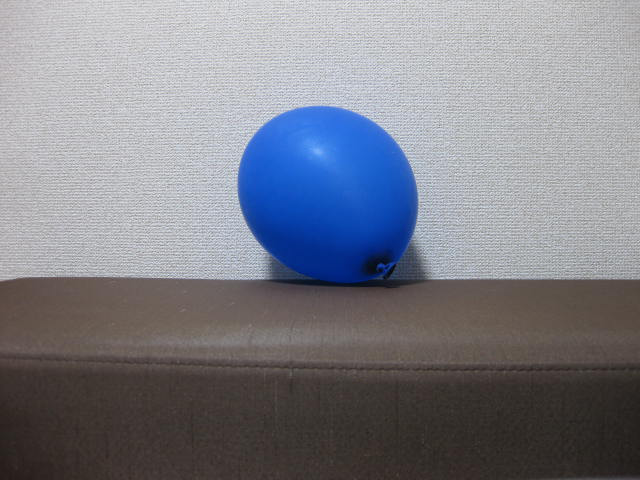

In [62]:
im2 = Image.open("home2.png")
im2

#### 配列のひき算

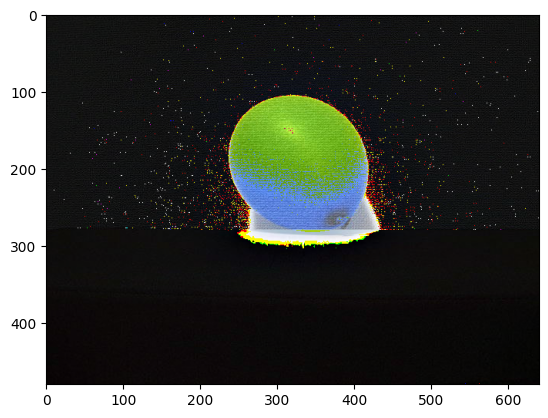

In [76]:
im1a = np.array(im1)
im2a = np.array(im2)

im2a -= im1a
plt.imshow(im2a)
plt.show()

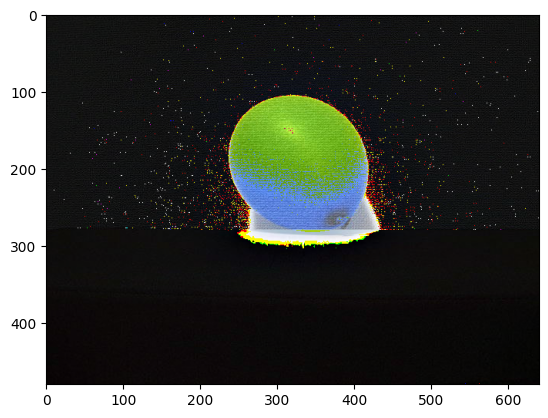

In [63]:
# 画像をndarray化
im1a = np.array(im1)
im2a = np.array(im2)

# 2つの配列をひき算した結果を表示
im2a -= im1a
plt.imshow(im2a)
plt.show()

#### Image.blend()

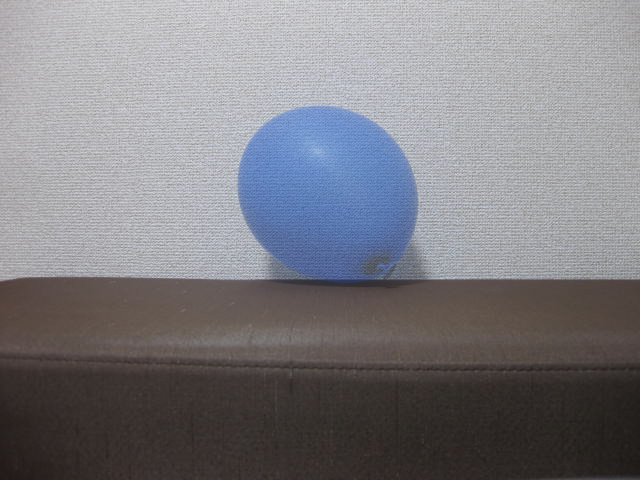

In [80]:
im3 = Image.blend(im1, im2, 0.5)
im3

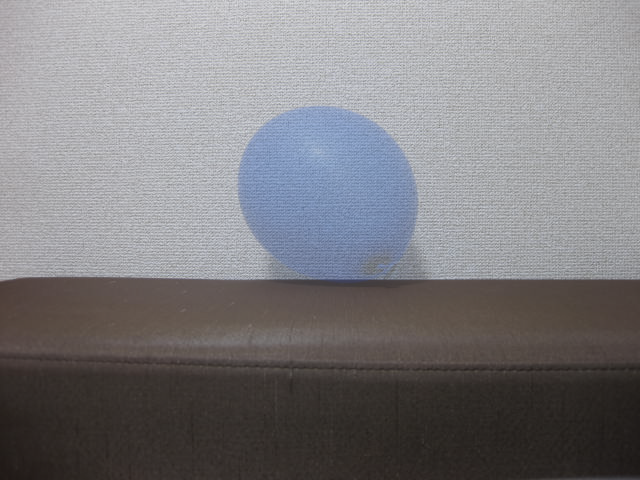

In [64]:
im3 = Image.blend(im1, im2, 0.3)
im3